# 3D Wave Equation Simulation
This notebook simulates the propagation of a wave in three dimensions using the finite difference method.

## The 3D Wave Equation

The 3D wave equation describes wave propagation in three-dimensional space, such as sound waves in air, seismic waves in the Earth, or electromagnetic waves in free space. Think of a firecracker exploding in the air—the sound waves spread out as spherical wavefronts in all directions.

Mathematically, the 3D wave equation is described by:

$$ \frac{\partial^2 u}{\partial t^2} = c^2 \left( \frac{\partial^2 u}{\partial x^2} + \frac{\partial^2 u}{\partial y^2} + \frac{\partial^2 u}{\partial z^2} \right) $$

where:
- \( u(x, y, z, t) \) is the displacement of the wave at position \( (x, y, z) \) and time \( t \).
- \( c \) is the speed of wave propagation.

This equation describes how disturbances propagate through three-dimensional media, from acoustic waves in concert halls to seismic waves traveling through the Earth's crust.

In [24]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import HTML
import plotly.graph_objects as go
import plotly.express as px
from plotly.subplots import make_subplots
import seaborn as sns

In [20]:
# Configure matplotlib for better figure display and centering
plt.rcParams['figure.facecolor'] = 'white'
plt.rcParams['axes.facecolor'] = 'white'
plt.rcParams['savefig.facecolor'] = 'white'

# Optional: Set default figure size for consistency
plt.rcParams['figure.figsize'] = [10, 8]
plt.rcParams['axes.grid'] = False  # Disable grid for all plots by default

<style>
.output_png {
    display: table-cell;
    text-align: center;
    vertical-align: middle;
}
</style>

### Discretization using Finite Differences

To solve this equation numerically, we discretize it in all three spatial dimensions plus time. The second-order partial derivatives can be approximated as:

$$ \frac{\partial^2 u}{\partial t^2} \approx \frac{u(x, y, z, t+\Delta t) - 2u(x, y, z, t) + u(x, y, z, t-\Delta t)}{(\Delta t)^2} $$

$$ \frac{\partial^2 u}{\partial x^2} \approx \frac{u(x+\Delta x, y, z, t) - 2u(x, y, z, t) + u(x-\Delta x, y, z, t)}{(\Delta x)^2} $$

$$ \frac{\partial^2 u}{\partial y^2} \approx \frac{u(x, y+\Delta y, z, t) - 2u(x, y, z, t) + u(x, y-\Delta y, z, t)}{(\Delta y)^2} $$

$$ \frac{\partial^2 u}{\partial z^2} \approx \frac{u(x, y, z+\Delta z, t) - 2u(x, y, z, t) + u(x, y, z-\Delta z, t)}{(\Delta z)^2} $$

Substituting these into the wave equation and rearranging for \( u(x, y, z, t+\Delta t) \) (which we can write as \( u_{i,j,k}^{n+1} \)), we get the update rule:

$$ u_{i,j,k}^{n+1} = 2u_{i,j,k}^n - u_{i,j,k}^{n-1} + C^2 \left( u_{i+1,j,k}^n + u_{i-1,j,k}^n + u_{i,j+1,k}^n + u_{i,j-1,k}^n + u_{i,j,k+1}^n + u_{i,j,k-1}^n - 6u_{i,j,k}^n \right) $$

where
- $C = c \frac{\Delta t}{\Delta x}$ is the Courant number, assuming $\Delta x = \Delta y = \Delta z$.
- For stability in 3D, we must have $C \le \frac{1}{\sqrt{3}}$.

In [3]:
# Simulation parameters
grid_size = 50       # Grid size (grid_size x grid_size x grid_size)
dx = 0.1             # Spatial step
c = 1.0              # Wave speed
dt = dx * 0.4 / c    # Time step (for stability, Courant number <= 1/sqrt(3))
end_time = 10        # Total simulation time

In [4]:
def solve_wave_equation_3d(Lx=1.0, Ly=1.0, Lz=1.0, T=1.0, Nx=50, Ny=50, Nz=50, Nt=200, c=1.0,
                            initial_condition=None, boundary_type='dirichlet',
                            damping=0.0):
    """
    Solve the 3D wave equation using the FDTD method.

    Parameters:
    -----------
    Lx, Ly, Lz : float
        Domain size in x, y, and z directions
    T : float
        Total simulation time
    Nx, Ny, Nz : int
        Number of spatial points in x, y, and z
    Nt : int
        Number of time steps
    c : float
        Wave speed
    initial_condition : function or None
        Function u(x, y, z) for initial displacement
    boundary_type : str
        'dirichlet', 'neumann', or 'periodic'
    damping : float
        Damping coefficient

    Returns:
    --------
    u : ndarray
        Wave field with shape (Nt, Nz, Ny, Nx)
    x, y, z, t : ndarray
        Spatial and temporal grids
    """
    dx = Lx / (Nx - 1)
    dy = Ly / (Ny - 1)
    dz = Lz / (Nz - 1)
    dt = T / Nt
    x = np.linspace(0, Lx, Nx)
    y = np.linspace(0, Ly, Ny)
    z = np.linspace(0, Lz, Nz)
    t = np.linspace(0, T, Nt)

    # Courant condition (assuming dx = dy = dz)
    r = c * dt / dx
    if r >= 1.0 / np.sqrt(3):
        raise ValueError(f"Unstable: Courant number r = {r:.3f} >= {1.0/np.sqrt(3):.3f}")

    # Initialize wavefields
    u = np.zeros((Nt, Nz, Ny, Nx))

    # Initial condition
    if initial_condition is None:
        X, Y, Z = np.meshgrid(x, y, z, indexing='ij')
        xc, yc, zc = Lx / 2, Ly / 2, Lz / 2
        width = 0.1
        u[0] = np.exp(-((X - xc)**2 + (Y - yc)**2 + (Z - zc)**2) / (2 * width**2))
    else:
        u[0] = initial_condition(x, y, z)

    # Second time step
    u[1, 1:-1, 1:-1, 1:-1] = (u[0, 1:-1, 1:-1, 1:-1] +
                               0.5 * r**2 * (
                                   u[0, 2:, 1:-1, 1:-1] + u[0, :-2, 1:-1, 1:-1] +
                                   u[0, 1:-1, 2:, 1:-1] + u[0, 1:-1, :-2, 1:-1] +
                                   u[0, 1:-1, 1:-1, 2:] + u[0, 1:-1, 1:-1, :-2] -
                                   6 * u[0, 1:-1, 1:-1, 1:-1]))

    u[1] = _apply_boundaries_3d(u[1], boundary_type)

    # Time evolution
    for n in range(1, Nt - 1):
        u_laplacian = (u[n, 2:, 1:-1, 1:-1] + u[n, :-2, 1:-1, 1:-1] +
                       u[n, 1:-1, 2:, 1:-1] + u[n, 1:-1, :-2, 1:-1] +
                       u[n, 1:-1, 1:-1, 2:] + u[n, 1:-1, 1:-1, :-2] -
                       6 * u[n, 1:-1, 1:-1, 1:-1])
        
        u_t = (u[n, 1:-1, 1:-1, 1:-1] - u[n-1, 1:-1, 1:-1, 1:-1]) / dt

        u[n+1, 1:-1, 1:-1, 1:-1] = (2 * u[n, 1:-1, 1:-1, 1:-1] - u[n-1, 1:-1, 1:-1, 1:-1] +
                                    r**2 * u_laplacian -
                                    damping * dt * u_t)

        u[n+1] = _apply_boundaries_3d(u[n+1], boundary_type)

    return u, x, y, z, t


def _apply_boundaries_3d(u_slice, boundary_type):
    if boundary_type == 'dirichlet':
        u_slice[0, :, :] = 0
        u_slice[-1, :, :] = 0
        u_slice[:, 0, :] = 0
        u_slice[:, -1, :] = 0
        u_slice[:, :, 0] = 0
        u_slice[:, :, -1] = 0
    elif boundary_type == 'neumann':
        u_slice[0, 1:-1, 1:-1] = u_slice[1, 1:-1, 1:-1]
        u_slice[-1, 1:-1, 1:-1] = u_slice[-2, 1:-1, 1:-1]
        u_slice[1:-1, 0, 1:-1] = u_slice[1:-1, 1, 1:-1]
        u_slice[1:-1, -1, 1:-1] = u_slice[1:-1, -2, 1:-1]
        u_slice[1:-1, 1:-1, 0] = u_slice[1:-1, 1:-1, 1]
        u_slice[1:-1, 1:-1, -1] = u_slice[1:-1, 1:-1, -2]
    elif boundary_type == 'periodic':
        u_slice[0, :, :] = u_slice[-2, :, :]
        u_slice[-1, :, :] = u_slice[1, :, :]
        u_slice[:, 0, :] = u_slice[:, -2, :]
        u_slice[:, -1, :] = u_slice[:, 1, :]
        u_slice[:, :, 0] = u_slice[:, :, -2]
        u_slice[:, :, -1] = u_slice[:, :, 1]
    return u_slice


def gaussian_pulse_3d(x, y, z, center=(0.5, 0.5, 0.5), width=0.1):
    X, Y, Z = np.meshgrid(x, y, z, indexing='ij')
    return np.exp(-((X - center[0])**2 + (Y - center[1])**2 + (Z - center[2])**2) / (2 * width**2))

In [32]:
def visualize_3d_slices(u, x, y, z, t, pulses=None, title="", time_idx=0):
    """
    Visualize 3D wave field using beautiful cross-sectional slices with seaborn styling.
    
    Parameters:
    -----------
    u : ndarray
        Wave field with shape (Nt, Nz, Ny, Nx)
    x, y, z, t : ndarray
        Spatial and temporal grids
    pulses : list of tuples, optional
        Initial pulse locations (x0, y0, z0, width, amplitude)
    title : str
        Plot title
    time_idx : int
        Time index to visualize
    """
    import seaborn as sns
    
    # Set beautiful seaborn style
    sns.set_style("whitegrid")
    sns.set_palette("husl")
    
    Nt, Nz, Ny, Nx = u.shape
    
    # Get middle slices
    mid_x = Nx // 2
    mid_y = Ny // 2
    mid_z = Nz // 2
    
    # Create figure with better layout
    fig = plt.figure(figsize=(14, 4))
    
    # Create subplots with proper spacing
    gs = fig.add_gridspec(1, 4, width_ratios=[1, 1, 1, 0.05], wspace=0.3, hspace=0.3)
    
    ax1 = fig.add_subplot(gs[0, 0])
    ax2 = fig.add_subplot(gs[0, 1])
    ax3 = fig.add_subplot(gs[0, 2])
    cax = fig.add_subplot(gs[0, 3])
    
    # Beautiful color scheme
    cmap = sns.diverging_palette(240, 10, n=200, as_cmap=True)
    
    # Calculate global min/max for consistent scaling
    vmin, vmax = np.percentile(u[time_idx], [5, 95])
    if abs(vmin) > abs(vmax):
        vmax = abs(vmin)
    else:
        vmin = -abs(vmax)
    
    # XY slice (mid Z)
    im1 = ax1.imshow(u[time_idx, mid_z, :, :], extent=[x[0], x[-1], y[0], y[-1]], 
                     origin='lower', cmap=cmap, vmin=vmin, vmax=vmax, aspect='equal')
    ax1.set_title(f'XY Cross-Section\n(z = {z[mid_z]:.2f})', fontsize=14, fontweight='bold')
    ax1.set_xlabel('x', fontsize=12)
    ax1.set_ylabel('y', fontsize=12)
    ax1.grid(False)
    
    # XZ slice (mid Y)
    im2 = ax2.imshow(u[time_idx, :, mid_y, :], extent=[x[0], x[-1], z[0], z[-1]], 
                     origin='lower', cmap=cmap, vmin=vmin, vmax=vmax, aspect='equal')
    ax2.set_title(f'XZ Cross-Section\n(y = {y[mid_y]:.2f})', fontsize=14, fontweight='bold')
    ax2.set_xlabel('x', fontsize=12)
    ax2.set_ylabel('z', fontsize=12)
    ax2.grid(False)
    
    # YZ slice (mid X)
    im3 = ax3.imshow(u[time_idx, :, :, mid_x], extent=[y[0], y[-1], z[0], z[-1]], 
                     origin='lower', cmap=cmap, vmin=vmin, vmax=vmax, aspect='equal')
    ax3.set_title(f'YZ Cross-Section\n(x = {x[mid_x]:.2f})', fontsize=14, fontweight='bold')
    ax3.set_xlabel('y', fontsize=12)
    ax3.set_ylabel('z', fontsize=12)
    ax3.grid(False)
    
    # Add beautiful colorbar
    cbar = plt.colorbar(im1, cax=cax)
    cbar.set_label('Wave Displacement', fontsize=12, fontweight='bold')
    cbar.ax.tick_params(labelsize=10)
    
    # Annotate pulses on all relevant slices
    if pulses and time_idx == 0:
        for j, (x_p, y_p, z_p, width, amp) in enumerate(pulses):
            pulse_type = "Positive" if amp > 0 else "Negative"
            color = '#FF6B6B' if amp > 0 else '#4ECDC4'
            
            # XY slice - show if pulse is near this z-level
            if abs(z_p - z[mid_z]) < 0.2:
                ax1.scatter(x_p, y_p, s=150, c=color, marker='o', 
                           edgecolors='white', linewidth=2, alpha=0.8, zorder=5)
                ax1.annotate(f'{pulse_type} Pulse {j+1}', 
                            xy=(x_p, y_p), xytext=(x_p + 0.1, y_p + 0.1),
                            arrowprops=dict(arrowstyle='->', color='black', lw=1.5),
                            fontsize=10, fontweight='bold',
                            bbox=dict(boxstyle="round,pad=0.3", facecolor=color, 
                                     edgecolor='white', alpha=0.9))
            
            # XZ slice - show if pulse is near this y-level
            if abs(y_p - y[mid_y]) < 0.2:
                ax2.scatter(x_p, z_p, s=150, c=color, marker='s', 
                           edgecolors='white', linewidth=2, alpha=0.8, zorder=5)
                ax2.annotate(f'{pulse_type} Pulse {j+1}', 
                            xy=(x_p, z_p), xytext=(x_p + 0.1, z_p + 0.1),
                            arrowprops=dict(arrowstyle='->', color='black', lw=1.5),
                            fontsize=10, fontweight='bold',
                            bbox=dict(boxstyle="round,pad=0.3", facecolor=color, 
                                     edgecolor='white', alpha=0.9))
            
            # YZ slice - show if pulse is near this x-level
            if abs(x_p - x[mid_x]) < 0.2:
                ax3.scatter(y_p, z_p, s=150, c=color, marker='^', 
                           edgecolors='white', linewidth=2, alpha=0.8, zorder=5)
                ax3.annotate(f'{pulse_type} Pulse {j+1}', 
                            xy=(y_p, z_p), xytext=(y_p + 0.1, z_p + 0.1),
                            arrowprops=dict(arrowstyle='->', color='black', lw=1.5),
                            fontsize=10, fontweight='bold',
                            bbox=dict(boxstyle="round,pad=0.3", facecolor=color, 
                                     edgecolor='white', alpha=0.9))
    
    # Add time information with beautiful styling
    fig.suptitle(f"{title} | Time: {t[time_idx]:.3f}s", 
                fontsize=18, fontweight='bold', y=1.05)
    
    # Add subtle background
    fig.patch.set_facecolor('#F8F9FA')
    
    # Print pulse information with beautiful formatting
    if pulses:
        print("🌊 Pulse Information:")
        print("=" * 50)
        for i, pulse in enumerate(pulses):
            x_p, y_p, z_p, width, amp = pulse
            pulse_type = "Positive ➕" if amp > 0 else "Negative ➖"
            print(f"  Pulse {i+1} ({pulse_type}): "
                  f"Position ({x_p:.3f}, {y_p:.3f}, {z_p:.3f}) | "
                  f"Amplitude: {amp:.3f} | Width: {width:.3f}")
        print("=" * 50)

In [49]:
def plotly_3d_visualization(u, x, y, z, t, time_idx=0, threshold=0.1, title="3D Wave Visualization"):
    """
    Create beautiful interactive 3D visualization using plotly.
    
    Parameters:
    -----------
    u : ndarray
        Wave field with shape (Nt, Nz, Ny, Nx)
    x, y, z, t : ndarray
        Spatial and temporal grids
    time_idx : int
        Time index to visualize
    threshold : float
        Isosurface threshold for visualization
    title : str
        Plot title
    """
    # Get the 3D field at specified time
    field = u[time_idx]
    
    # Create meshgrid
    X, Y, Z = np.meshgrid(x, y, z, indexing='ij')
    
    # Create beautiful isosurface plot with multiple surfaces
    fig = go.Figure()
    
    # Add positive isosurface (no colorbar)
    fig.add_trace(go.Isosurface(
        x=X.flatten(),
        y=Y.flatten(),
        z=Z.flatten(),
        value=field.flatten(),
        isomin=threshold/2,
        isomax=threshold,
        surface_count=3,
        colorscale=[[0, 'rgba(255, 100, 100, 0.8)'], [1, 'rgba(200, 50, 50, 0.9)']],
        showscale=False,
        name='Positive Wave',
        caps=dict(x_show=False, y_show=False, z_show=False)
    ))
    
    # Add negative isosurface (no colorbar)
    fig.add_trace(go.Isosurface(
        x=X.flatten(),
        y=Y.flatten(),
        z=Z.flatten(),
        value=field.flatten(),
        isomin=-threshold,
        isomax=-threshold/2,
        surface_count=3,
        colorscale=[[0, 'rgba(100, 150, 255, 0.8)'], [1, 'rgba(50, 100, 200, 0.9)']],
        showscale=False,
        name='Negative Wave',
        caps=dict(x_show=False, y_show=False, z_show=False)
    ))
    
    # Update layout with beautiful styling
    fig.update_layout(
        title={
            'text': f"🌊 {title}<br><sub>Time: {t[time_idx]:.3f}s</sub>",
            'x': 0.5,
            'font': {'size': 18, 'family': "Arial, sans-serif"}
        },
        scene=dict(
            xaxis_title='X Position',
            yaxis_title='Y Position', 
            zaxis_title='Z Position',
            aspectmode='cube',
            camera=dict(
                eye=dict(x=1.5, y=1.5, z=1.5)
            ),
            bgcolor='rgb(248, 249, 250)',
            xaxis=dict(
                backgroundcolor="rgb(230, 230, 230)",
                gridcolor="white",
                showbackground=True,
                zerolinecolor="white"
            ),
            yaxis=dict(
                backgroundcolor="rgb(230, 230, 230)",
                gridcolor="white",
                showbackground=True,
                zerolinecolor="white"
            ),
            zaxis=dict(
                backgroundcolor="rgb(230, 230, 230)",
                gridcolor="white",
                showbackground=True,
                zerolinecolor="white"
            )
        ),
        width=900,
        height=700,
        font=dict(family="Arial, sans-serif"),
        paper_bgcolor='rgb(248, 249, 250)',
        plot_bgcolor='rgb(248, 249, 250)'
    )
    
    return fig

In [12]:
def combined_gaussian_pulses_3d(x, y, z, pulses):
    """
    Sum multiple 3D Gaussian pulses with amplitudes.

    Parameters:
    - x, y, z: 1D spatial arrays
    - pulses: list of tuples (x0, y0, z0, width, amplitude)

    Returns:
    - u0: 3D array initial displacement
    """
    u0 = np.zeros((len(z), len(y), len(x)))
    for (x0, y0, z0, width, amp) in pulses:
        pulse = gaussian_pulse_3d(x, y, z, center=(x0, y0, z0), width=width)
        u0 += amp * pulse
    return u0

# Define multiple 3D pulses
pulses_3d = [
    (0.5, 0.5, 0.5, 0.08, 1.0),    # center pulse, positive
    (0.3, 0.7, 0.3, 0.06, -0.8),   # corner pulse, negative
    (0.7, 0.3, 0.7, 0.05, 0.6),    # another corner pulse, positive
]

# Solve the 3D wave equation
u_3d, x_3d, y_3d, z_3d, t_3d = solve_wave_equation_3d(
    Lx=1.0, Ly=1.0, Lz=1.0, T=1.0, Nx=50, Ny=50, Nz=50, Nt=200,
    initial_condition=lambda x, y, z: combined_gaussian_pulses_3d(x, y, z, pulses_3d)
)

print("3D simulation completed!")
print(f"Grid size: {u_3d.shape}")
print(f"Time steps: {len(t_3d)}")

3D simulation completed!
Grid size: (200, 50, 50, 50)
Time steps: 200


## Visualization of 3D Waves

Due to the complexity of visualizing 3D data, we provide multiple approaches:

1. **Cross-sectional slices** - Show XY, XZ, and YZ slices through the middle of the domain
2. **Interactive 3D plots** - Use plotly for interactive isosurface visualization
3. **Animation** - Animate the cross-sections over time

🌊 Pulse Information:
  Pulse 1 (Positive ➕): Position (0.500, 0.500, 0.500) | Amplitude: 1.000 | Width: 0.080
  Pulse 2 (Negative ➖): Position (0.300, 0.700, 0.300) | Amplitude: -0.800 | Width: 0.060
  Pulse 3 (Positive ➕): Position (0.700, 0.300, 0.700) | Amplitude: 0.600 | Width: 0.050


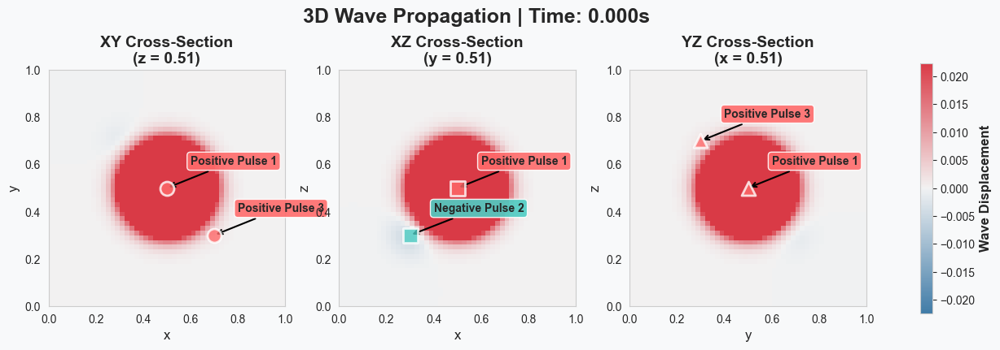

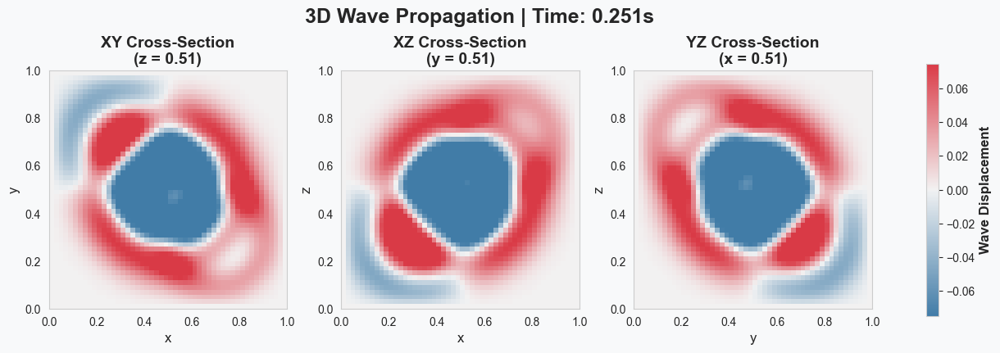

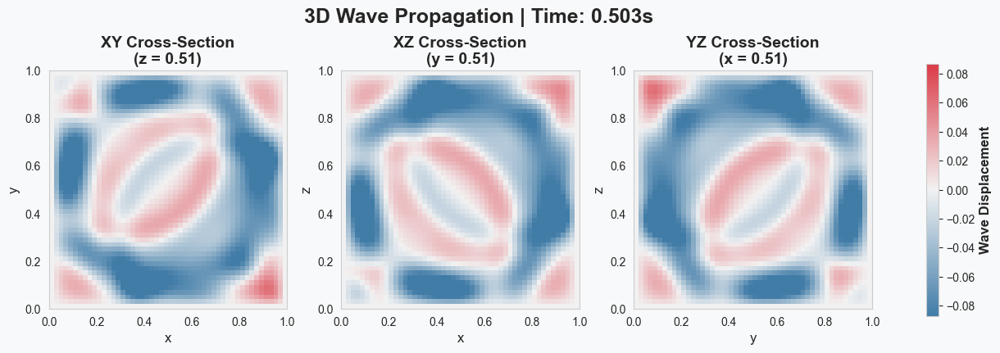

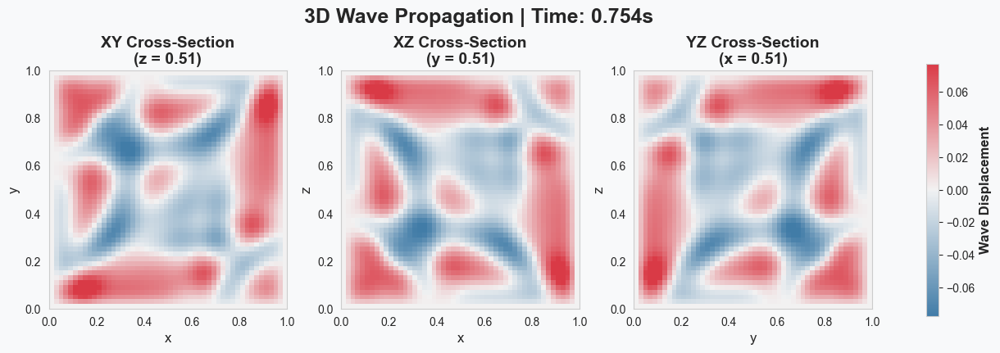

In [33]:
# Visualize initial condition and wave propagation at different times
time_indices = [0, len(t_3d)//4, len(t_3d)//2, 3*len(t_3d)//4]

for i, time_idx in enumerate(time_indices):
    visualize_3d_slices(u_3d, x_3d, y_3d, z_3d, t_3d, pulses=pulses_3d if time_idx == 0 else None, 
                       title=f"3D Wave Propagation", time_idx=time_idx)

In [51]:
# Interactive 3D visualization using plotly
fig_3d = plotly_3d_visualization(u_3d, x_3d, y_3d, z_3d, t_3d, time_idx=60, threshold=0.1)
fig_3d.show()

In [53]:
def animate_3d_slices(u, x, y, z, t, pulses=None, 
                      interval=100, skip_frames=2, save_gif=False, filename="wave_3d.gif"):
    """
    Create an animation of 3D wave cross-sections with beautiful styling.
    
    Parameters:
    -----------
    u : ndarray
        Wave field with shape (Nt, Nz, Ny, Nx)
    x, y, z, t : ndarray
        Spatial and temporal grids
    pulses : list of tuples, optional
        Initial pulse locations
    interval : int
        Time between frames in milliseconds
    skip_frames : int
        Number of frames to skip
    save_gif : bool
        Whether to save animation as GIF
    filename : str
        Filename for saved GIF
        
    Returns:
    --------
    anim : FuncAnimation
        Animation object
    """
    Nt, Nz, Ny, Nx = u.shape
    mid_x, mid_y, mid_z = Nx // 2, Ny // 2, Nz // 2
    
    # Set beautiful seaborn style (matching visualize_3d_slices)
    import seaborn as sns
    sns.set_style("whitegrid")
    sns.set_palette("husl")
    
    # Create figure with better layout (matching visualize_3d_slices)
    fig = plt.figure(figsize=(14, 4))
    
    # Create subplots with proper spacing (matching visualize_3d_slices)
    gs = fig.add_gridspec(1, 4, width_ratios=[1, 1, 1, 0.05], wspace=0.3, hspace=0.3)
    
    ax1 = fig.add_subplot(gs[0, 0])
    ax2 = fig.add_subplot(gs[0, 1])
    ax3 = fig.add_subplot(gs[0, 2])
    cax = fig.add_subplot(gs[0, 3])
    
    # Beautiful color scheme (matching visualize_3d_slices)
    cmap = sns.diverging_palette(240, 10, n=200, as_cmap=True)
    
    # Calculate global min/max for consistent scaling (matching visualize_3d_slices)
    vmin, vmax = np.percentile(u, [5, 95])
    if abs(vmin) > abs(vmax):
        vmax = abs(vmin)
    else:
        vmin = -abs(vmax)
    
    # Initialize images with better styling (matching visualize_3d_slices)
    im1 = ax1.imshow(u[0, mid_z, :, :], extent=[x[0], x[-1], y[0], y[-1]], 
                     origin='lower', cmap=cmap, vmin=vmin, vmax=vmax, aspect='equal')
    im2 = ax2.imshow(u[0, :, mid_y, :], extent=[x[0], x[-1], z[0], z[-1]], 
                     origin='lower', cmap=cmap, vmin=vmin, vmax=vmax, aspect='equal')
    im3 = ax3.imshow(u[0, :, :, mid_x], extent=[y[0], y[-1], z[0], z[-1]], 
                     origin='lower', cmap=cmap, vmin=vmin, vmax=vmax, aspect='equal')
    
    # Better titles and labels (matching visualize_3d_slices)
    ax1.set_title(f'XY Cross-Section\n(z = {z[mid_z]:.2f})', fontsize=14, fontweight='bold')
    ax2.set_title(f'XZ Cross-Section\n(y = {y[mid_y]:.2f})', fontsize=14, fontweight='bold')
    ax3.set_title(f'YZ Cross-Section\n(x = {x[mid_x]:.2f})', fontsize=14, fontweight='bold')
    
    ax1.set_xlabel('x', fontsize=12)
    ax1.set_ylabel('y', fontsize=12)
    ax2.set_xlabel('x', fontsize=12)
    ax2.set_ylabel('z', fontsize=12)
    ax3.set_xlabel('y', fontsize=12)
    ax3.set_ylabel('z', fontsize=12)
    
    # Remove grid for cleaner look (matching visualize_3d_slices)
    for ax in [ax1, ax2, ax3]:
        ax.grid(False)
    
    # Add beautiful colorbar (matching visualize_3d_slices)
    cbar = plt.colorbar(im1, cax=cax)
    cbar.set_label('Wave Displacement', fontsize=12, fontweight='bold')
    cbar.ax.tick_params(labelsize=10)
    
    # Add subtle background (matching visualize_3d_slices)
    fig.patch.set_facecolor('#F8F9FA')
    
    # Time text
    time_text = fig.suptitle('', fontsize=18, fontweight='bold', y=1.05)
    
    def animate(frame):
        time_idx = frame * skip_frames
        if time_idx >= Nt:
            time_idx = Nt - 1
            
        im1.set_array(u[time_idx, mid_z, :, :])
        im2.set_array(u[time_idx, :, mid_y, :])
        im3.set_array(u[time_idx, :, :, mid_x])
        
        time_text.set_text(f'🌊 3D Wave Animation | Time: {t[time_idx]:.3f}s')
        
        return [im1, im2, im3, time_text]
    
    frames = Nt // skip_frames
    anim = FuncAnimation(fig, animate, frames=frames, interval=interval, 
                        blit=False, repeat=True)
    plt.close(fig)
    
    if save_gif:
        print(f"Saving animation as {filename}...")
        anim.save(filename, writer='pillow', fps=1000//interval)
        print("Animation saved!")
    
    return anim

## Animated 3D Visualization

Now let's create an animation showing the 3D wave propagation through cross-sectional slices:

In [54]:
# Create and display the 3D animation
anim_3d = animate_3d_slices(u_3d, x_3d, y_3d, z_3d, t_3d, pulses=pulses_3d, 
                           interval=50, skip_frames=3)

# Display the animation in the notebook
HTML(anim_3d.to_jshtml())

/var/folders/13/b14w66xd7plcv19ylpmhl54w0000gn/T/ipykernel_65068/2402972835.py:6: UserWarning:

Glyph 127754 (\N{WATER WAVE}) missing from font(s) Arial.



## Summary

This notebook demonstrates 3D wave equation simulation with:

- **Mathematical foundation** - The 3D wave equation and finite difference discretization
- **Numerical solver** - Complete 3D FDTD implementation with stability constraints
- **Multiple visualization methods**:
  - Cross-sectional slice plots (XY, XZ, YZ planes)
  - Interactive 3D isosurface plots using plotly
  - Animated cross-sections showing wave propagation
- **Multiple pulse support** - Simulation of multiple 3D Gaussian pulses with interference

The 3D case is computationally more intensive than 2D, so we use smaller grid sizes. The visualization challenges are addressed through multiple complementary approaches that help understand the 3D wave dynamics.

Key differences from 2D:
- Stability condition: $C \leq \frac{1}{\sqrt{3}}$ (more restrictive)
- 6 neighbors in the Laplacian (instead of 4)
- Visualization requires slicing or isosurfaces
- Much higher memory and computational requirements